In [ ]:
!pip install opencv-python-headless

In [ ]:
!pip install opencv-contrib-python==4.5.5.62

  Using cached opencv_contrib_python-4.5.5.62-cp36-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (66.6 MB)
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.8.0.76
    Uninstalling opencv-contrib-python-4.8.0.76:
      Successfully uninstalled opencv-contrib-python-4.8.0.76


In [1]:
import cv2
import numpy as np
import datetime



# Load the images (you can replace these paths with your own image files)
img1 = cv2.imread("/content/vlcsnap-2024-03-13-19h40m26s511.png", cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread("/content/vlcsnap-2024-03-13-19h40m39s134.png", cv2.IMREAD_GRAYSCALE)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find keypoints and descriptors for both images
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

FLANN_INDEX_KDTREE = 0

# Create FLANN-based matcher
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=10)
search_params = dict(checks=75)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Match descriptors using k-nearest neighbors
matches = flann.knnMatch(des1, des2, k=2)

# Apply ratio test to filter good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# Calculate similarity score
similarity_score = len(good_matches) / max(len(des1), len(des2))

# Set a threshold for similarity (you can adjust this based on your requirements)
similarity_threshold = 0.4

if similarity_score > similarity_threshold:
    print("The images are similar.")
else:
    print("The images are not very similar.")

The images are not very similar.


In [2]:
len(good_matches)

38

In [8]:
# Draw matches
matching_result = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

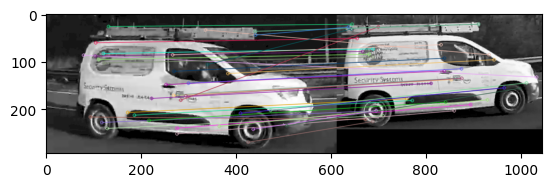

In [7]:
import matplotlib.pyplot as plt

plt.imshow(matching_result)

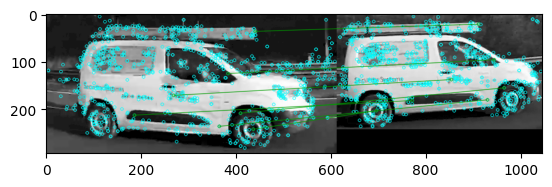

In [10]:

import numpy as np
import cv2

# load the images
# image1 = cv2.imread('Bhagavad-Gita.jpg')
# image2 = cv2.imread('Geeta.jpg')

#img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
#img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
keypoint1, descriptors1 = sift.detectAndCompute(img1, None)
keypoint2, descriptors2 = sift.detectAndCompute(img2, None)

# finding nearest match with KNN algorithm
index_params = dict(algorithm=0, trees=20)
search_params = dict(checks=150)   # or pass empty dictionary

# Initialize the FlannBasedMatcher
flann = cv2.FlannBasedMatcher(index_params, search_params)

Matches = flann.knnMatch(descriptors1, descriptors2, k=2)

# Need to draw only good matches, so create a mask
good_matches = [[0, 0] for i in range(len(Matches))]

# Ratio Test
for i, (m, n) in enumerate(Matches):
    if m.distance < 0.5*n.distance:
        good_matches[i] = [1, 0]

# Draw the matches using drawMatchesKnn()
Matched = cv2.drawMatchesKnn(img1,
                             keypoint1,
                             img2,
                             keypoint2,
                             Matches,
                             outImg=None,
                             matchColor=(0, 155, 0),
                             singlePointColor=(0, 255, 255),
                             matchesMask=good_matches,
                             flags=0
                             )

plt.imshow(Matched)

In [13]:
len(good_matches)/len(matches)

1.0

In [ ]:
des1.shape

(1048, 128)

In [ ]:
from numpy.linalg import norm

In [ ]:
cosine = np.dot(des1,des2)/(norm(des1)*norm(des2))
print("Cosine Similarity:", cosine)

ValueError: shapes (920,128) and (781,128) not aligned: 128 (dim 1) != 781 (dim 0)

In [ ]:
print(similarity_score)

0.04456521739130435


In [ ]:
import matplotlib.pyplot as plt

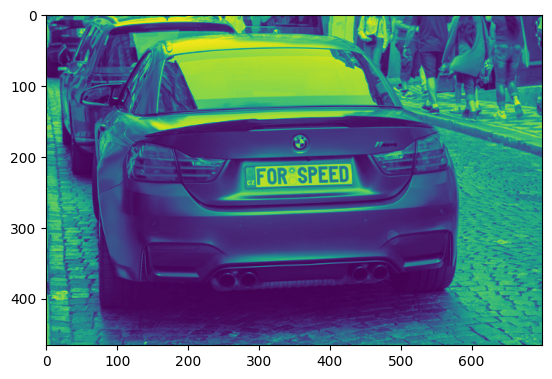

In [ ]:
plt.imshow(img1)

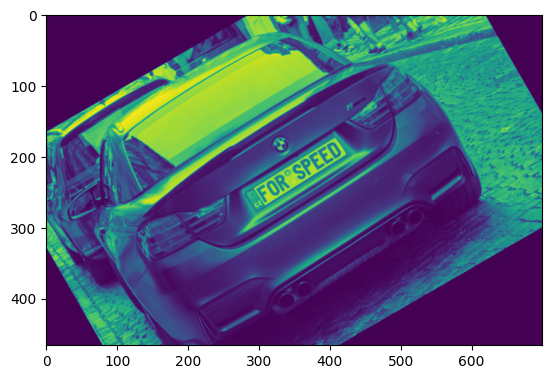

In [ ]:
plt.imshow(img2)

## Brute Force

In [ ]:
import cv2
import numpy as np

In [ ]:
car1 = cv2.imread('/content/input.png', cv2.IMREAD_GRAYSCALE)
car2 = cv2.imread('/content/sample.png', cv2.IMREAD_GRAYSCALE)

In [ ]:
# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect key points and compute descriptors
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

In [ ]:
# Initialize the Brute-Force Matcher
bf = cv2.BFMatcher()

# Match descriptors
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

In [ ]:
# Apply ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

In [ ]:
# Draw matches
matching_result = cv2.drawMatches(img1, keypoints1, img2, keypoints2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

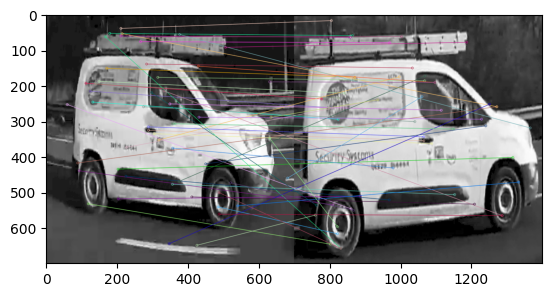

In [ ]:
plt.imshow(matching_result)

In [ ]:
!unzip cars.zip -d ./cars/

In [ ]:
import os

In [ ]:
_, _, files = next(os.walk("/content/cars"))
file_count = len(files)

In [ ]:
print(file_count)

78


In [ ]:
import matplotlib.pyplot as plt

19.5

In [ ]:
import os
import matplotlib.pyplot as plt

N_COLS = 1
directory = "/content/cars"
file_count = len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])
N_ROWS = (file_count // N_COLS) + 1

fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(500, 500))

i = 0
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".jpg"):
        image_path = os.path.join(directory, filename)
        image = plt.imread(image_path)
        ax = axes.flat[i]
        ax.imshow(image, cmap='gray')
        ax.set_title(f"Label: {filename}")
        ax.axis('off')
        i += 1
        if i >= N_ROWS * N_COLS:
            break

plt.tight_layout()
plt.show()

In [2]:
!unzip /content/cars.zip -d ./cars/
!rm cars.zip

Archive:  /content/cars.zip
replace ./cars/car_1152.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: ./cars/car_1152.jpg     
  inflating: ./cars/car_1158.jpg     
  inflating: ./cars/car_1161.jpg     
  inflating: ./cars/car_1173.jpg     
  inflating: ./cars/car_1179.jpg     
  inflating: ./cars/car_1182.jpg     
  inflating: ./cars/car_1194.jpg     
  inflating: ./cars/car_1200.jpg     
  inflating: ./cars/car_1209.jpg     
  inflating: ./cars/car_1215.jpg     
  inflating: ./cars/car_1218.jpg     
  inflating: ./cars/car_1221.jpg     
  inflating: ./cars/car_1224.jpg     
  inflating: ./cars/car_1227.jpg     
  inflating: ./cars/car_1230.jpg     
  inflating: ./cars/car_1233.jpg     
  inflating: ./cars/car_1236.jpg     
  inflating: ./cars/car_1239.jpg     
  inflating: ./cars/car_1245.jpg     
  inflating: ./cars/car_1248.jpg     
  inflating: ./cars/car_1251.jpg     
  inflating: ./cars/car_1254.jpg     
  inflating: ./cars/car_1257.jpg     
  inflating: ./cars/car_402.j

In [23]:
color_matches_twenty_tree_150_checks = []

In [24]:
import cv2
import glob

folder_path = "/content/cars"

images = [cv2.imread(file) for file in glob.glob(f"{folder_path}/*.jpg")]

given_image = cv2.imread("/content/car_1221.jpg")

sift = cv2.SIFT_create()

kp_given, des_given = sift.detectAndCompute(given_image, None)

# bf = cv2.BFMatcher()

index_params = dict(algorithm=0, trees=20)
search_params = dict(checks=150)

flann = cv2.FlannBasedMatcher(index_params, search_params)

for i, other_image in enumerate(images, start=1):
    kp_other, des_other = sift.detectAndCompute(other_image, None)

    matches = flann.knnMatch(des_given, des_other, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    # print(f"Image {i}: {len(good_matches)} matches")
    color_matches_twenty_tree_150_checks.append(len(good_matches))

In [25]:
import matplotlib.pyplot as plt

Text(0.5, 1.0, 'Input Image')

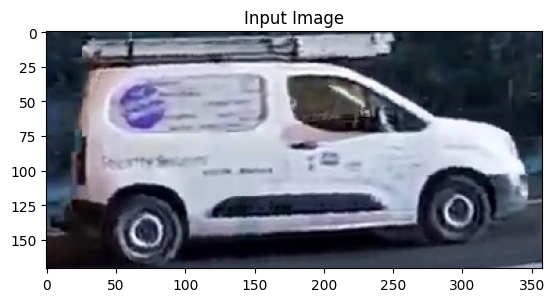

In [26]:
plt.imshow(given_image)
plt.title("Input Image")

In [27]:
print(len(color_matches_twenty_tree_150_checks))
print(len(images))

78
78


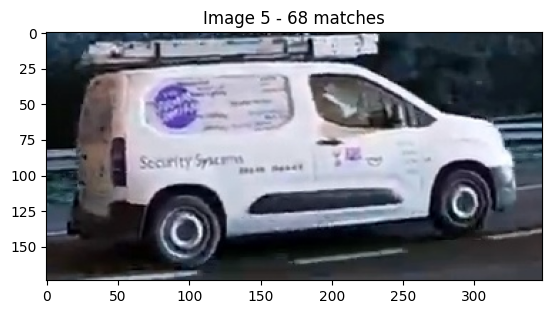

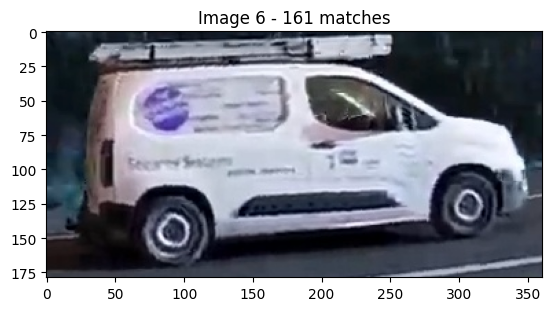

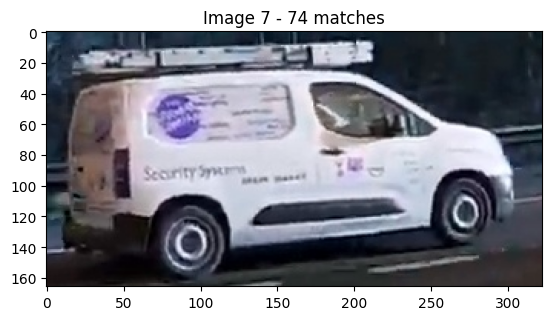

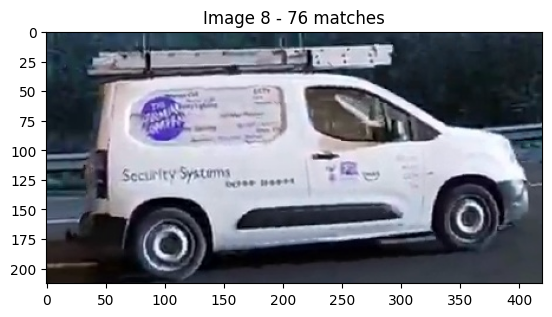

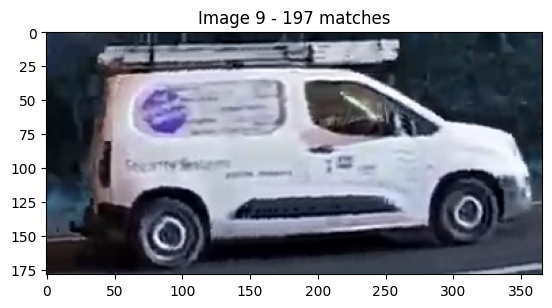

...

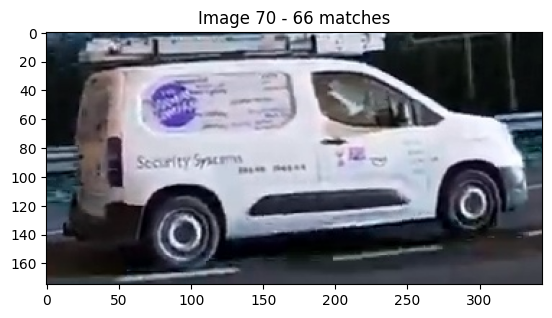

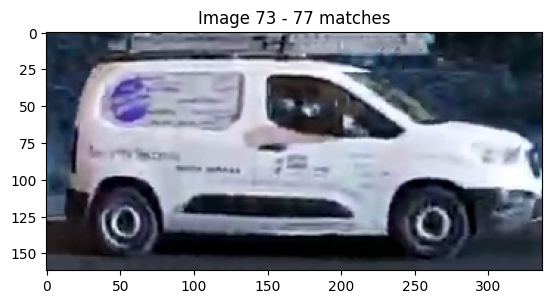

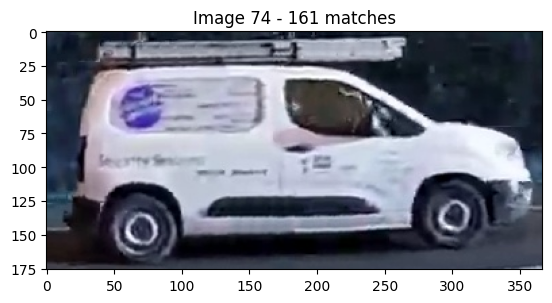

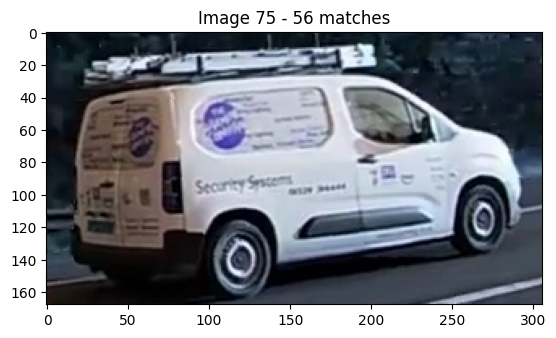

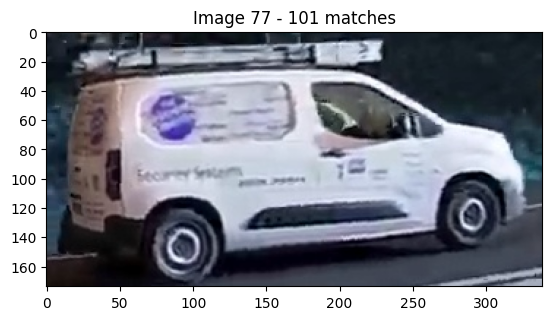

In [28]:
for i,image in enumerate(images):
  if color_matches_twenty_tree_150_checks[i] >=50:
    plt.imshow(image)
    plt.title(f"Image {i} - {color_matches_twenty_tree_150_checks[i]} matches")
    plt.show()

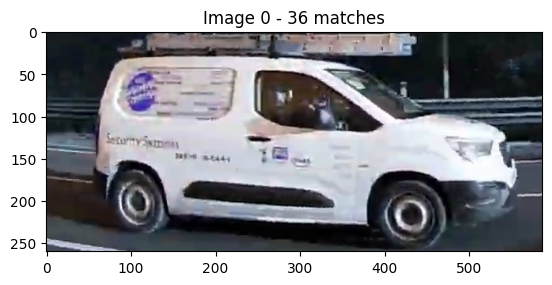

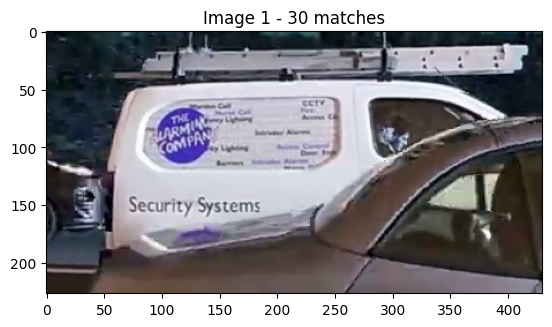

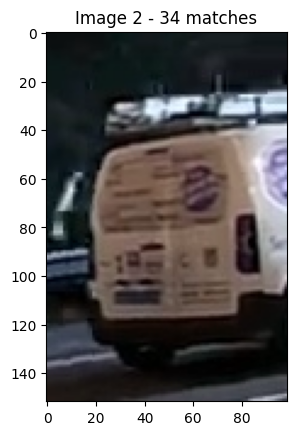

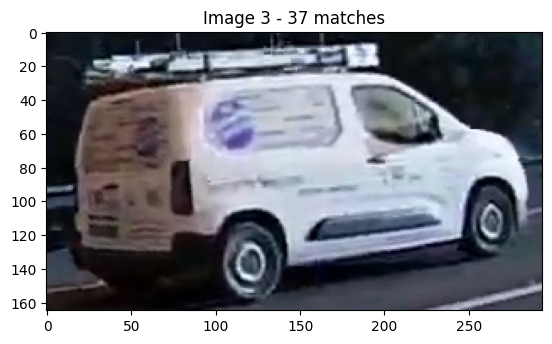

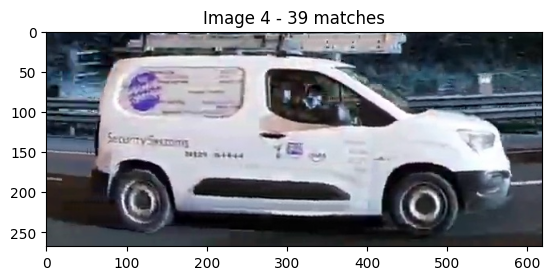

...

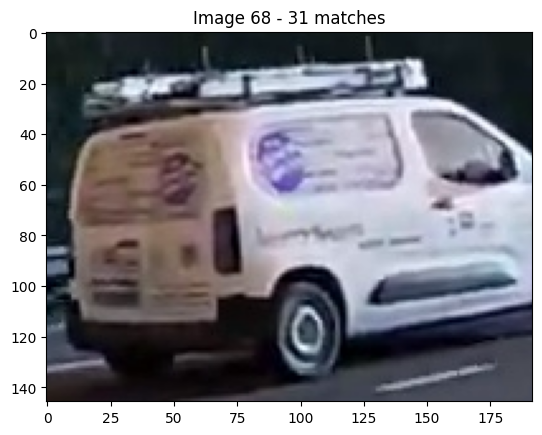

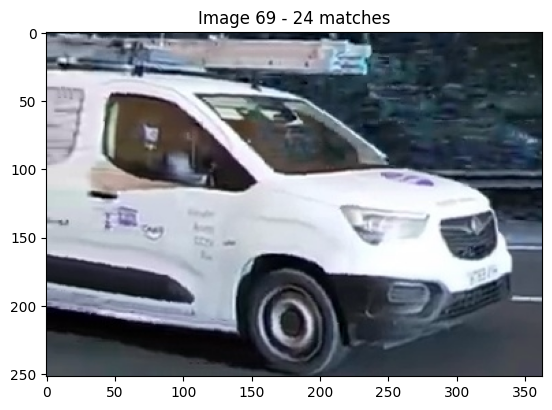

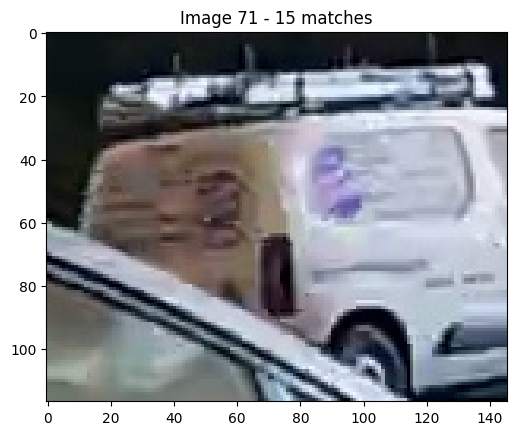

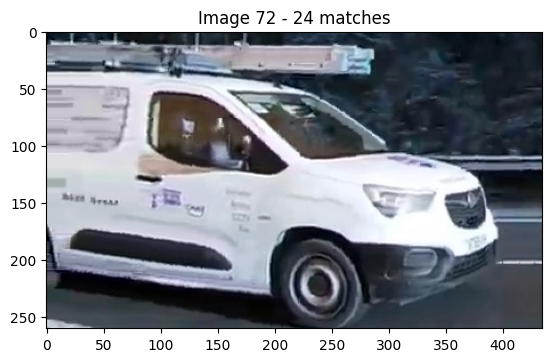

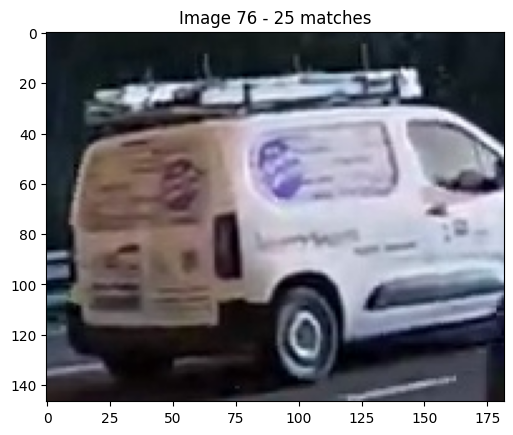

In [29]:
for i,image in enumerate(images):
  if color_matches_twenty_tree_150_checks[i] <50:
    plt.imshow(image)
    plt.title(f"Image {i} - {color_matches_twenty_tree_150_checks[i]} matches")
    plt.show()

In [30]:
another_car = cv2.imread("/content/car_462.jpg")

In [31]:
kp_another, des_another = sift.detectAndCompute(another_car, None)

In [32]:
another_car_match = flann.knnMatch(des_given, des_another, k=2)

another_good_matches = []
for m, n in another_car_match:
    if m.distance < 0.75 * n.distance:
        another_good_matches.append(m)


print(f"Len of Matches for Another Car: {len(another_car_match)}")
print(f"Len of Good Matches for Another Car: {len(another_good_matches)}")

Len of Matches for Another Car: 461
Len of Good Matches for Another Car: 14


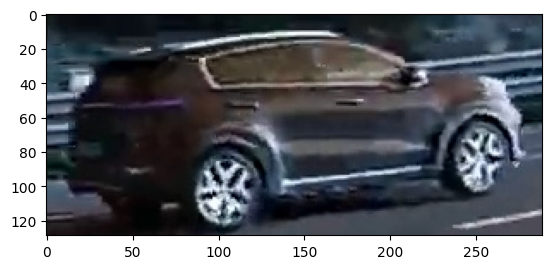

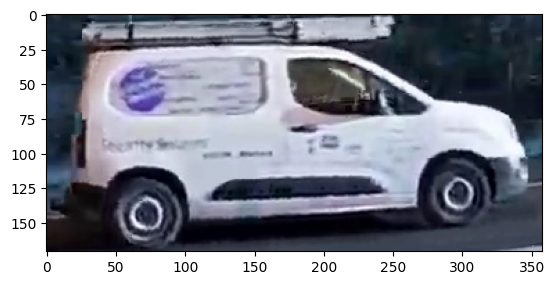

In [33]:
plt.imshow(another_car)
plt.show()
plt.imshow(given_image)
plt.show()

In [35]:
matching_result = cv2.drawMatches(given_image, kp_given, another_car, kp_another, another_good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

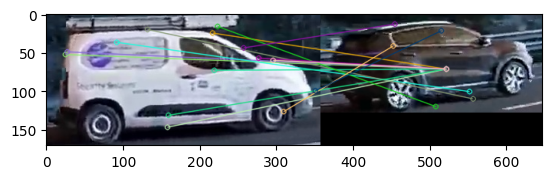

In [36]:
plt.imshow(matching_result)